In [ ]:
import requests
from datetime import datetime

start_year, start_month = 2024, 8
end = datetime.today()
base_url = "https://www.sidc.be/cactus/catalog/LASCO/2_5_0/qkl"

for year in range(start_year, end.year + 1):
    for month in range(1, 13):
        if year == start_year and month < start_month:
            continue
        if year == end.year and month > end.month:
            break
        month_str = f"{month:02d}"
        url = f"{base_url}/{year}/{month_str}/cmecat.txt"
        filename = f"cmecat_{year}_{month_str}.txt"

        response = requests.get(url)
        if response.status_code == 200:
            with open(filename, "wb") as f:
                f.write(response.content)
            print(f"Downloaded {filename}")
        else:
            print(f"Failed for {filename} - Status code: {response.status_code}")

Downloaded cmecat_2024_08.txt
Downloaded cmecat_2024_09.txt
Downloaded cmecat_2024_10.txt
Downloaded cmecat_2024_11.txt
Downloaded cmecat_2024_12.txt
Downloaded cmecat_2025_01.txt
Downloaded cmecat_2025_02.txt
Downloaded cmecat_2025_03.txt
Downloaded cmecat_2025_04.txt
Downloaded cmecat_2025_05.txt
Downloaded cmecat_2025_06.txt
Downloaded cmecat_2025_07.txt


In [ ]:
import pandas as pd

def parse_cme_file(file_path, da_threshold=90):
    data = []

    with open(file_path, 'r') as f:
        for line in f:
            if line.startswith("#") or line.strip() == "":
                continue

            parts = [p.strip() for p in line.strip().split('|')]
            if len(parts) < 6:
                continue

            try:
                cme_id = parts[0]
                t0 = parts[1]
                da = float(parts[4])  # Angular width
                v = float(parts[5])   # Speed
                halo=parts[9]
                if da >= da_threshold:
                    data.append([cme_id, t0, da, v,halo])
            except ValueError:
                continue

    df = pd.DataFrame(data, columns=["CME_ID", "Timestamp", "Angular_Width", "Speed","halo?"])
    return df



In [ ]:
start_year, start_month = 2024, 8
end_year,end_month=2025,6
OUTPUT_FILE = "halo_cme_events_aug2024_to_present.csv"
all_dfs=[]
for year in range(start_year, end_year + 1):
    for month in range(1, 13):
        if year == start_year and month < start_month:
            continue
        if year == end_year and month > end_month:
            break

        month_str = f"{month:02d}"
        filename = f"cmecat_{year}_{month_str}.txt"
        df_halo = parse_cme_file(filename, da_threshold=90)
        if not df_halo.empty:
            all_dfs.append(df_halo)

df_combined = pd.concat(all_dfs, ignore_index=True)

df_combined.to_csv("combined_halo_cmes.csv", index=False)

In [ ]:
import pandas as pd

cactus_df = pd.read_csv("combined_halo_cmes.csv")

cactus_df['CME_Datetime'] = pd.to_datetime(cactus_df['Timestamp'], format='%Y/%m/%d %H:%M')

cactus_df.rename(columns={
    'Angular_Width': 'AW',
    'Speed': 'Velocity',
    'halo?': 'Halo_Type'
}, inplace=True)

cactus_df = cactus_df.sort_values(by='CME_Datetime')

cactus_df = cactus_df[cactus_df['Halo_Type'] == 'IV']    #complete halo

print(cactus_df[['CME_ID', 'CME_Datetime', 'AW', 'Velocity', 'Halo_Type']].head())


    CME_ID        CME_Datetime     AW  Velocity Halo_Type
3      118 2024-08-22 08:36:00  288.0    1644.0        IV
24      38 2024-09-09 02:48:00  360.0    1077.0        IV
23      39 2024-09-09 03:12:00  340.0    1302.0        IV
20      62 2024-09-13 04:17:00  360.0    1683.0        IV
15     104 2024-09-26 13:25:00  324.0     322.0        IV


In [ ]:
import pandas as pd
import requests
from io import StringIO

url = 'https://izw1.caltech.edu/ACE/ASC/DATA/level3/icmetable2.htm'
html = requests.get(url).text
dfs = pd.read_html(StringIO(html), header=[0, 1])  # multiindex header

rc_df = dfs[0]

rc_df.columns = [' '.join(col).strip() for col in rc_df.columns.values]

print("Flattened Columns:")
print(rc_df.columns.tolist())


Flattened Columns:
['Disturbance Y/M/D (UT) (a) Disturbance Y/M/D (UT) (a)', 'ICME Plasma/Field Start, End Y/M/D (UT) (b) ICME Plasma/Field Start, End Y/M/D (UT) (b)', 'ICME Plasma/Field Start, End Y/M/D (UT) (b) ICME Plasma/Field Start, End Y/M/D (UT) (b).1', 'Comp. Start, End (Hrs wrt. Plasma/ Field) (c) Comp. Start, End (Hrs wrt. Plasma/ Field) (c)', 'Comp. Start, End (Hrs wrt. Plasma/ Field) (c) Comp. Start, End (Hrs wrt. Plasma/ Field) (c).1', 'MC Start, End (Hrs wrt. Plasma/ Field) (d) MC Start, End (Hrs wrt. Plasma/ Field) (d)', 'MC Start, End (Hrs wrt. Plasma/ Field) (d) MC Start, End (Hrs wrt. Plasma/ Field) (d).1', 'BDE? (e) BDE? (e)', 'BIF? (f) BIF? (f)', 'Qual. (g) Qual. (g)', 'dV (km/s) (h) dV (km/s) (h)', 'V_ICME (km/s) (i) V_ICME (km/s) (i)', 'V_max (km/s) (j) V_max (km/s) (j)', 'B (nT) (k) B (nT) (k)', 'MC? (l) MC? (l)', 'Dst (nT) (m) Dst (nT) (m)', 'V_transit (km/s) (n) V_transit (km/s) (n)', 'LASCO CME Y/M/D (UT) (o) LASCO CME Y/M/D (UT) (o)', 'Unnamed: 18_level_0 Unn

In [ ]:
rc_df.rename(columns={
    'ICME Plasma/Field Start, End Y/M/D (UT) (b) ICME Plasma/Field Start, End Y/M/D (UT) (b)': 'ICME_Start',
    'Disturbance Y/M/D (UT) (a) Disturbance Y/M/D (UT) (a)': 'Shock_Arrival',
    'LASCO CME Y/M/D (UT) (o) LASCO CME Y/M/D (UT) (o)': 'CME_Launch',
    'V_transit (km/s) (n) V_transit (km/s) (n)': 'RC_Speed'
}, inplace=True)

rc_df['ICME_Start'] = pd.to_datetime(rc_df['ICME_Start'], errors='coerce')
rc_df['Shock_Arrival'] = pd.to_datetime(rc_df['Shock_Arrival'], errors='coerce')
rc_df['CME_Launch'] = pd.to_datetime(rc_df['CME_Launch'], errors='coerce')

rc_df['RC_Speed'] = pd.to_numeric(rc_df['RC_Speed'], errors='coerce')

rc_df.dropna(subset=['ICME_Start'], inplace=True)

rc_df.to_csv('rc_icme_parsed.csv', index=False)

print("Cleaned ICME data saved to 'rc_icme_parsed.csv'")


✅ Cleaned ICME data saved to 'rc_icme_parsed.csv'


/tmp/ipython-input-12-1384949207.py:10: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  rc_df['ICME_Start'] = pd.to_datetime(rc_df['ICME_Start'], errors='coerce')
/tmp/ipython-input-12-1384949207.py:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  rc_df['Shock_Arrival'] = pd.to_datetime(rc_df['Shock_Arrival'], errors='coerce')
/tmp/ipython-input-12-1384949207.py:12: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  rc_df['CME_Launch'] = pd.to_datetime(rc_df['CME_Launch'], errors='coerce')
/tmp/ipython-input-12-1384949207.py:12: FutureWarning: Parsed string "1996/12/19 1630 H" in

In [ ]:
import pandas as pd
from datetime import timedelta

cactus_df = pd.read_csv("combined_halo_cmes.csv")
rc_df = pd.read_csv("rc_icme_parsed.csv")

cactus_df['CME_Datetime'] = pd.to_datetime(cactus_df['Timestamp'], format='%Y/%m/%d %H:%M', errors='coerce')
rc_df['ICME_Start'] = pd.to_datetime(rc_df['ICME_Start'], errors='coerce')

matches = []

for _, cme in cactus_df.iterrows():
    cme_time = cme['CME_Datetime']
    window_start = cme_time + timedelta(days=1)
    window_end = cme_time + timedelta(days=5)

    # Find ICMEs that occur within 1–5 days of the CME
    potential_matches = rc_df[(rc_df['ICME_Start'] >= window_start) & (rc_df['ICME_Start'] <= window_end)]

    for _, icme in potential_matches.iterrows():
        matches.append({
            'CME_ID': cme['CME_ID'],
            'CME_Datetime': cme_time,
            'CME_Speed': cme['Speed'],
            'CME_Angular_Width': cme['Angular_Width'],
            'ICME_Start': icme['ICME_Start'],
            'Shock_Arrival': icme.get('Shock_Arrival', pd.NaT),
            'CME_Launch_RC': icme.get('CME_Launch', pd.NaT),
            'RC_Speed': icme.get('RC_Speed', None),
            'Transit_Time(days)': (icme['ICME_Start'] - cme_time).days
        })

matched_df = pd.DataFrame(matches)

matched_df.to_csv("matched_cactus_rc.csv", index=False)

print("Matching complete. File saved as: matched_cactus_rc.csv")


✅ Matching complete. File saved as: matched_cactus_rc.csv


In [ ]:
%pip install cdflib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.8/78.8 kB 6.3 MB/s eta 0:00:00


In [ ]:
import cdflib
import pandas as pd
import numpy as np

file_path = "AL1_ASW91_L2_BLK_20240822_UNP_9999_999999_V02.cdf"
cdf = cdflib.CDF(file_path)

epoch = cdf.varget("epoch_for_cdf_mod")
time = cdflib.cdfepoch.to_datetime(epoch)

proton_density = cdf.varget("proton_density")
proton_speed = cdf.varget("proton_bulk_speed")
proton_temp = cdf.varget("proton_thermal")

vx = cdf.varget("proton_xvelocity")
vy = cdf.varget("proton_yvelocity")
vz = cdf.varget("proton_zvelocity")

alpha_density = cdf.varget("alpha_density")
alpha_speed = cdf.varget("alpha_bulk_speed")
alpha_temp = cdf.varget("alpha_thermal")

def clean(var):
    return np.where(var == -1e31, np.nan, var)

proton_density = clean(proton_density)
proton_speed = clean(proton_speed)
proton_temp = clean(proton_temp)
vx = clean(vx)
vy = clean(vy)
vz = clean(vz)
alpha_density = clean(alpha_density)
alpha_speed = clean(alpha_speed)
alpha_temp = clean(alpha_temp)

df = pd.DataFrame({
    "Time": time,
    "Proton_Density": proton_density,
    "Proton_Speed": proton_speed,
    "Proton_Temperature": proton_temp,
    "Proton_Vx": vx,
    "Proton_Vy": vy,
    "Proton_Vz": vz,
    "Alpha_Density": alpha_density,
    "Alpha_Speed": alpha_speed,
    "Alpha_Temperature": alpha_temp
})

df.dropna(inplace=True)

print(df.head())


                       Time  Proton_Density  Proton_Speed  Proton_Temperature  \
139 2024-08-22 00:12:05.296        6.221721    331.435590           30.044364   
142 2024-08-22 00:12:20.296        6.136800    334.279587           30.414602   
156 2024-08-22 00:13:30.297        3.685270    342.734709           32.107938   
255 2024-08-22 00:21:45.301        1.684809    304.873998           32.068912   
259 2024-08-22 00:22:05.302        3.381896    307.220864           29.940210   

      Proton_Vx  Proton_Vy  Proton_Vz  Alpha_Density  Alpha_Speed  \
139 -331.435590  13.690036 -18.493444       0.056438   330.499624   
142 -334.279587  11.226836 -17.759119       0.052556   332.660411   
156 -342.734709  22.483627 -40.702325       0.037549   343.705248   
255 -304.873998  15.115036  -6.467774       0.175021   264.524151   
259 -307.220864   4.281051 -10.767466       0.202398   269.399879   

     Alpha_Temperature  
139          18.166220  
142          18.843960  
156          26.996306 

/tmp/ipython-input-16-2374048864.py:76: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-16-2374048864.py:76: UserWarning: Glyph 8314 (\N{SUPERSCRIPT PLUS SIGN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8314 (\N{SUPERSCRIPT PLUS SIGN}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


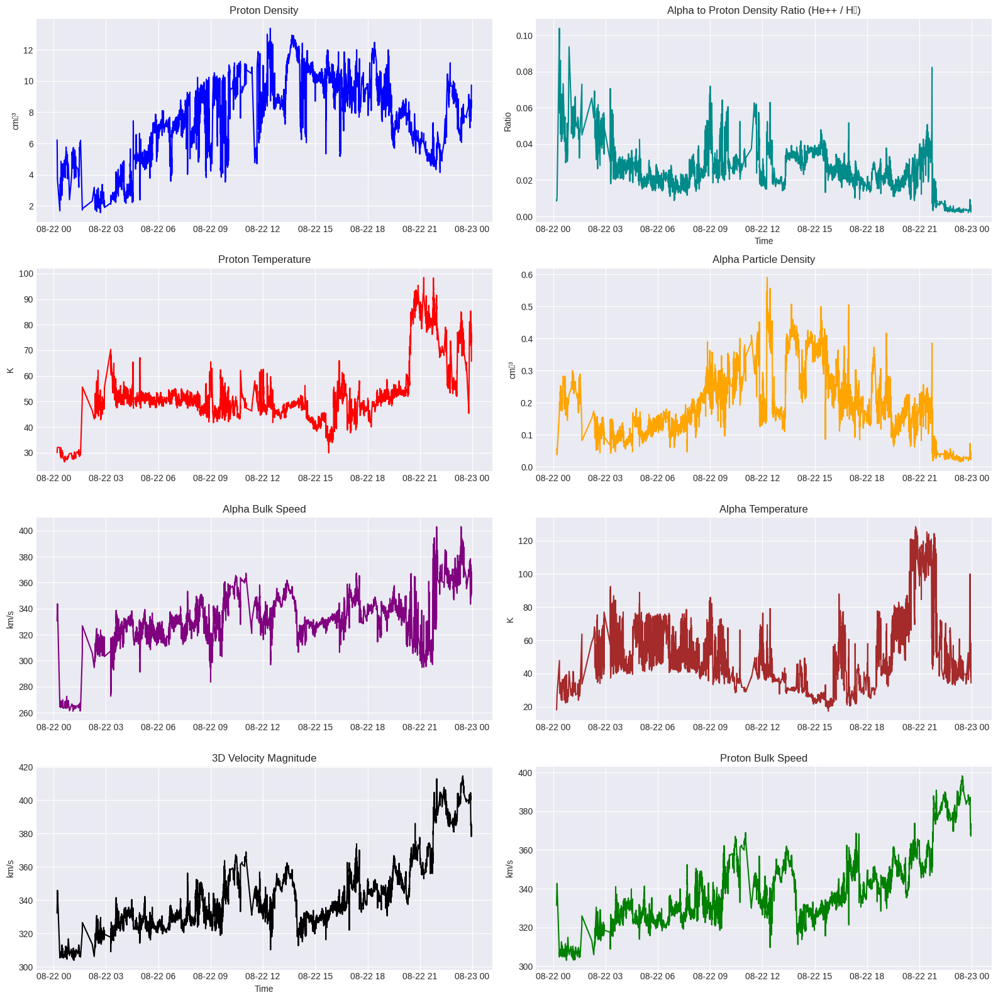

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

df["Velocity_Magnitude"] = np.sqrt(df["Proton_Vx"]**2 + df["Proton_Vy"]**2 + df["Proton_Vz"]**2)

# Avoid divide by zero
safe_proton_density = df["Proton_Density"].replace(0, np.nan)

df["Alpha_to_Proton_Ratio"] = df["Alpha_Density"] / safe_proton_density

plt.figure(figsize=(16, 16))

plt.subplot(4, 2, 1)
plt.plot(df["Time"], df["Proton_Density"], color='blue')
plt.title("Proton Density")
plt.ylabel("cm⁻³")
plt.grid(True)

plt.subplot(4, 2, 8)
plt.plot(df["Time"], df["Proton_Speed"], color='green')
plt.title("Proton Bulk Speed")
plt.ylabel("km/s")
plt.grid(True)

plt.subplot(4, 2, 3)
plt.plot(df["Time"], df["Proton_Temperature"], color='red')
plt.title("Proton Temperature")
plt.ylabel("K")
plt.grid(True)

plt.subplot(4, 2, 4)
plt.plot(df["Time"], df["Alpha_Density"], color='orange')
plt.title("Alpha Particle Density")
plt.ylabel("cm⁻³")
plt.grid(True)

=plt.subplot(4, 2, 5)
plt.plot(df["Time"], df["Alpha_Speed"], color='purple')
plt.title("Alpha Bulk Speed")
plt.ylabel("km/s")
plt.grid(True)

plt.subplot(4, 2, 6)
plt.plot(df["Time"], df["Alpha_Temperature"], color='brown')
plt.title("Alpha Temperature")
plt.ylabel("K")
plt.grid(True)

plt.subplot(4, 2, 7)
plt.plot(df["Time"], df["Velocity_Magnitude"], color='black')
plt.title("3D Velocity Magnitude")
plt.ylabel("km/s")
plt.xlabel("Time")
plt.grid(True)

plt.subplot(4, 2, 2)
plt.plot(df["Time"], df["Alpha_to_Proton_Ratio"], color='darkcyan')
plt.title("Alpha to Proton Density Ratio (He++ / H⁺)")
plt.ylabel("Ratio")
plt.xlabel("Time")
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import zipfile
import os
import cdflib
import pandas as pd
import numpy as np

zip_path = "swis_2025Jul08T165157913.zip"
extract_dir = "swis_aug2024_cdf_files"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

def clean(var):
    return np.where(var == -1e31, np.nan, var)

combined_data = []

for file in sorted(os.listdir(extract_dir)):
    if file.endswith(".cdf"):
        cdf_path = os.path.join(extract_dir, file)
        try:
            cdf = cdflib.CDF(cdf_path)
            epoch = cdf.varget("epoch_for_cdf_mod")
            datetime_values = pd.to_datetime(cdflib.cdfepoch.to_datetime(epoch))

            df = pd.DataFrame({
                "Time": datetime_values,
                "Proton_Density": clean(cdf.varget("proton_density")),
                "Proton_Speed": clean(cdf.varget("proton_bulk_speed")),
                "Proton_Temperature": clean(cdf.varget("proton_thermal")),
                "Proton_Vx": clean(cdf.varget("proton_xvelocity")),
                "Proton_Vy": clean(cdf.varget("proton_yvelocity")),
                "Proton_Vz": clean(cdf.varget("proton_zvelocity")),
                "Alpha_Density": clean(cdf.varget("alpha_density")),
                "Alpha_Speed": clean(cdf.varget("alpha_bulk_speed")),
                "Alpha_Temperature": clean(cdf.varget("alpha_thermal")),
            })

            df.dropna(inplace=True)
            combined_data.append(df)

        except Exception as e:
            print(f"Failed to process {file}: {e}")

if combined_data:
    full_df = pd.concat(combined_data).reset_index(drop=True)

    combined_csv_path = "swis_aug2024_combined.csv"
    full_df.to_csv(combined_csv_path, index=False)

    print(f"All files processed successfully.\nSaved to: {combined_csv_path}")
else
    print("No valid data found in ZIP.")



✅ All files processed successfully.
Saved to: swis_aug2024_combined.csv


In [ ]:
df=pd.read_csv("swis_aug2024_combined.csv")
print(df.head())

                      Time  Proton_Density  Proton_Speed  Proton_Temperature  \
0  2024-08-02 00:00:28.394       10.750223    429.605805           62.096487   
1  2024-08-02 00:00:33.394       10.804421    428.215552           60.788517   
2  2024-08-02 00:00:38.394       10.514903    429.075817           61.939259   
3  2024-08-02 00:00:43.394       10.166846    431.786913           61.419492   
4  2024-08-02 00:00:48.394       10.206146    431.961593           60.263924   

    Proton_Vx  Proton_Vy  Proton_Vz  Alpha_Density  Alpha_Speed  \
0 -429.605805  17.463041 -40.725529       0.209477   430.124678   
1 -428.215552  17.201568 -41.686767       0.218076   429.843888   
2 -429.075817  22.954454 -41.076500       0.211389   431.013978   
3 -431.786913  19.784779 -49.751836       0.182516   435.106869   
4 -431.961593  23.104480 -49.312521       0.192492   433.497467   

   Alpha_Temperature  
0          49.314741  
1          49.164969  
2          48.728509  
3          50.543736  
4

/tmp/ipython-input-19-1744297353.py:70: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-19-1744297353.py:70: UserWarning: Glyph 8314 (\N{SUPERSCRIPT PLUS SIGN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8314 (\N{SUPERSCRIPT PLUS SIGN}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


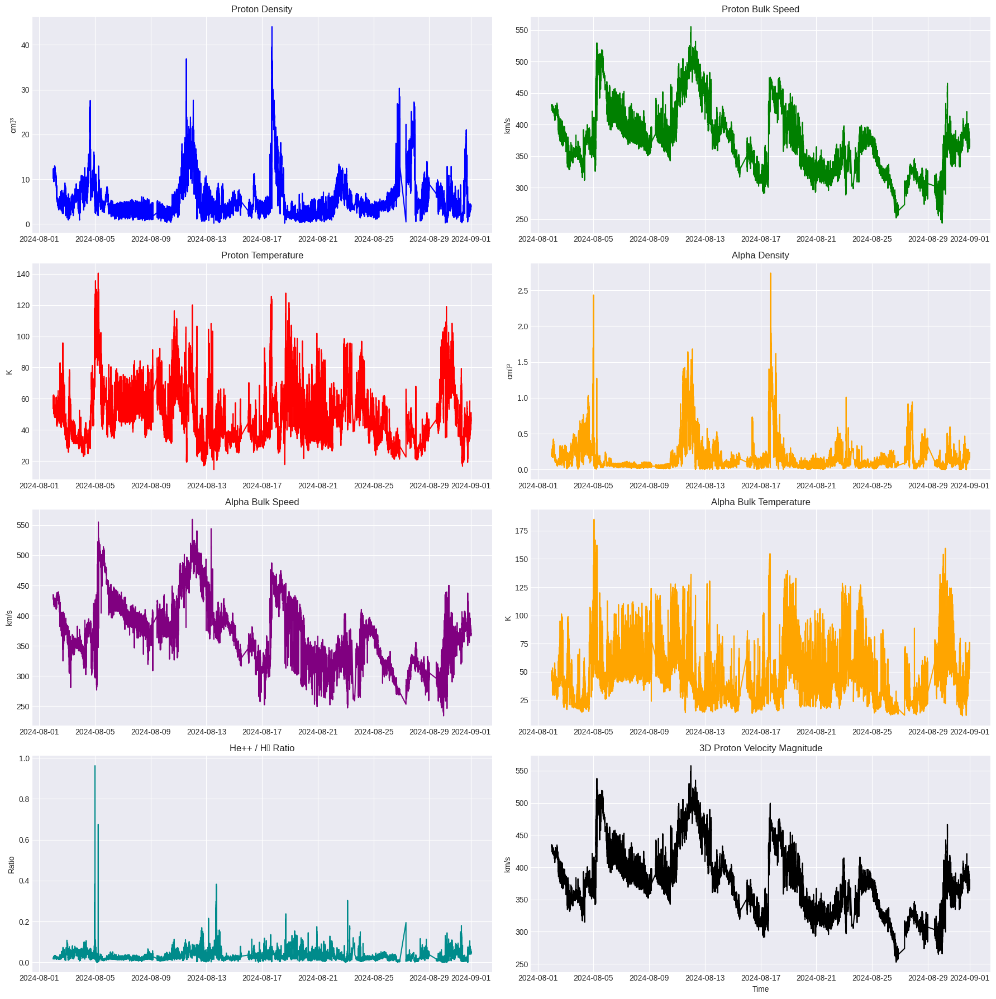

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

full_df["Velocity_Magnitude"] = np.sqrt(full_df["Proton_Vx"]**2 +
                                        full_df["Proton_Vy"]**2 +
                                        full_df["Proton_Vz"]**2)

full_df["Alpha_to_Proton_Ratio"] = full_df["Alpha_Density"] / full_df["Proton_Density"].replace(0, np.nan)

plt.figure(figsize=(18, 18))

plt.subplot(4, 2, 1)
plt.plot(full_df["Time"], full_df["Proton_Density"], color="blue")
plt.title("Proton Density")
plt.ylabel("cm⁻³")
plt.grid(True)

plt.subplot(4, 2, 2)
plt.plot(full_df["Time"], full_df["Proton_Speed"], color="green")
plt.title("Proton Bulk Speed")
plt.ylabel("km/s")
plt.grid(True)

plt.subplot(4, 2, 3)
plt.plot(full_df["Time"], full_df["Proton_Temperature"], color="red")
plt.title("Proton Temperature")
plt.ylabel("K")
plt.grid(True)

plt.subplot(4, 2, 4)
plt.plot(full_df["Time"], full_df["Alpha_Density"], color="orange")
plt.title("Alpha Density")
plt.ylabel("cm⁻³")
plt.grid(True)

plt.subplot(4, 2, 5)
plt.plot(full_df["Time"], full_df["Alpha_Speed"], color="purple")
plt.title("Alpha Bulk Speed")
plt.ylabel("km/s")
plt.grid(True)

plt.subplot(4, 2, 6)
plt.plot(full_df["Time"], full_df["Alpha_Temperature"], color="orange")
plt.title("Alpha Bulk Temperature")
plt.ylabel("K")
plt.grid(True)

plt.subplot(4, 2, 7)
plt.plot(full_df["Time"], full_df["Alpha_to_Proton_Ratio"], color="darkcyan")
plt.title("He++ / H⁺ Ratio")
plt.ylabel("Ratio")
plt.grid(True)

plt.subplot(4, 2, 8)
plt.plot(full_df["Time"], full_df["Velocity_Magnitude"], color="black")
plt.title("3D Proton Velocity Magnitude")
plt.ylabel("km/s")
plt.xlabel("Time")
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
from datetime import timedelta

swis_df = pd.read_csv("swis_aug2024_combined.csv", parse_dates=["Time"])
cme_df = pd.read_csv("matched_cactus_rc.csv", parse_dates=["CME_Datetime"])

pre_window = timedelta(days=1)
post_window = timedelta(days=3)

cme_windows = []

for index, row in cme_df.iterrows():
    cme_time = row["CME_Datetime"]
    start_time = cme_time - pre_window
    end_time = cme_time + post_window

    window_df = swis_df[(swis_df["Time"] >= start_time) & (swis_df["Time"] <= end_time)].copy()
    window_df["CME_ID"] = row["CME_ID"]
    window_df["CME_Time"] = cme_time

    if not window_df.empty:
        cme_windows.append(window_df)

all_cme_windows_df = pd.concat(cme_windows, ignore_index=True)

all_cme_windows_df.to_csv("swis_cme_windows_aug2024.csv", index=False)

print("Extracted data windows around each CME event.")


✅ Extracted data windows around each CME event.


/tmp/ipython-input-21-1307273615.py:87: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-21-1307273615.py:87: UserWarning: Glyph 8314 (\N{SUPERSCRIPT PLUS SIGN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8315 (\N{SUPERSCRIPT MINUS}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8314 (\N{SUPERSCRIPT PLUS SIGN}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


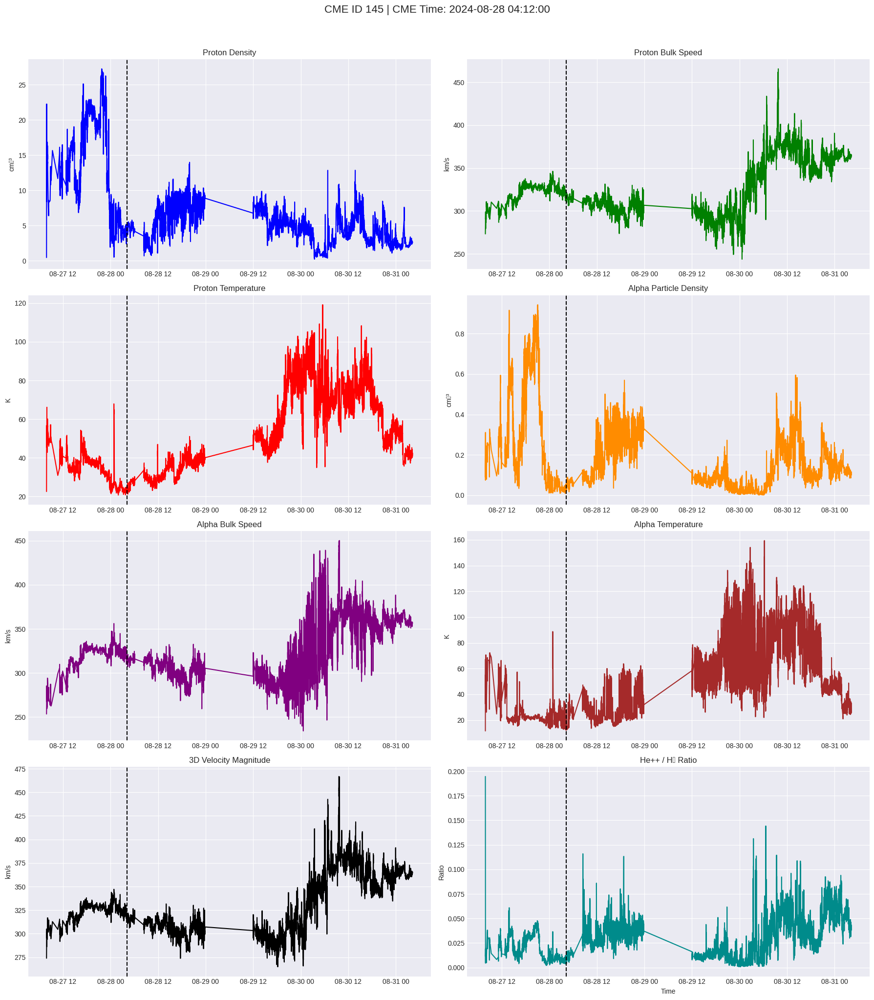

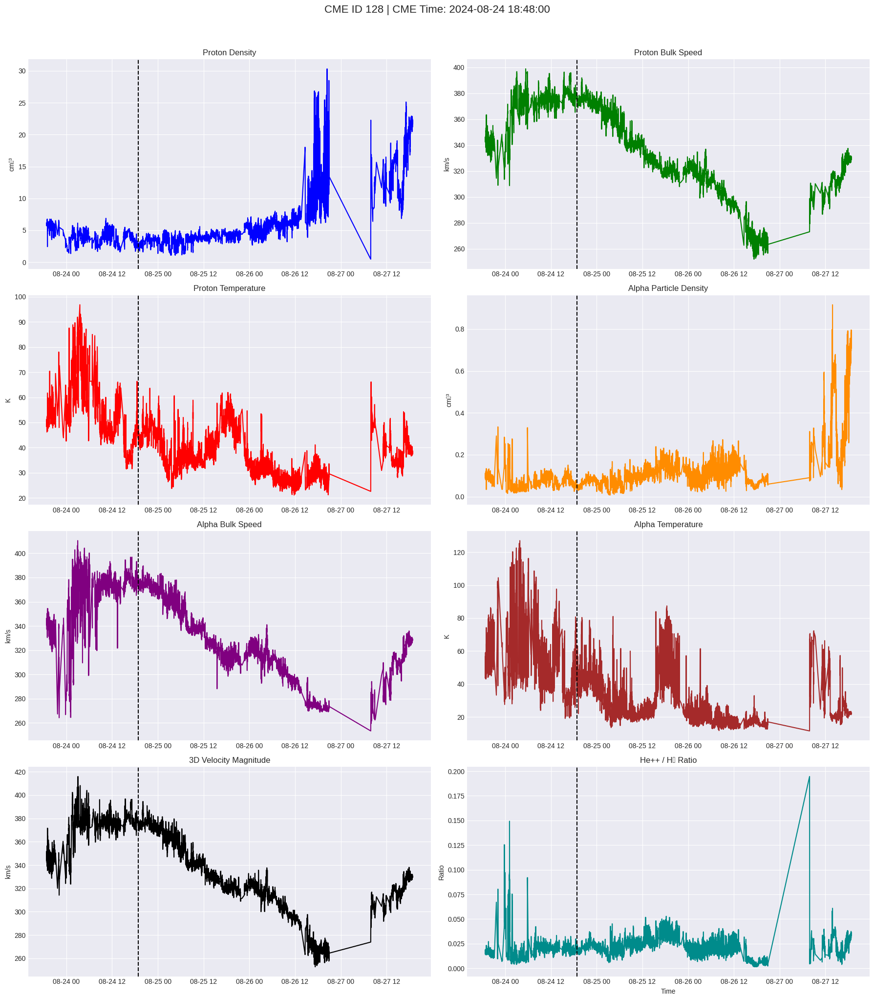

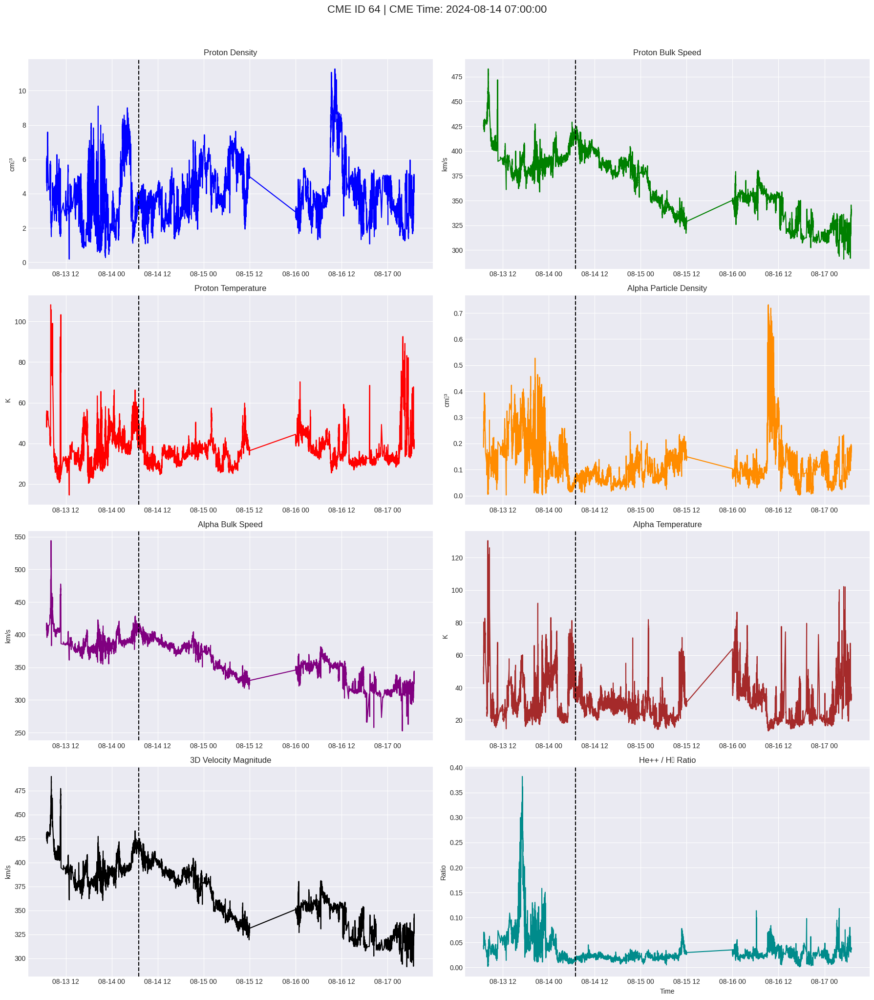

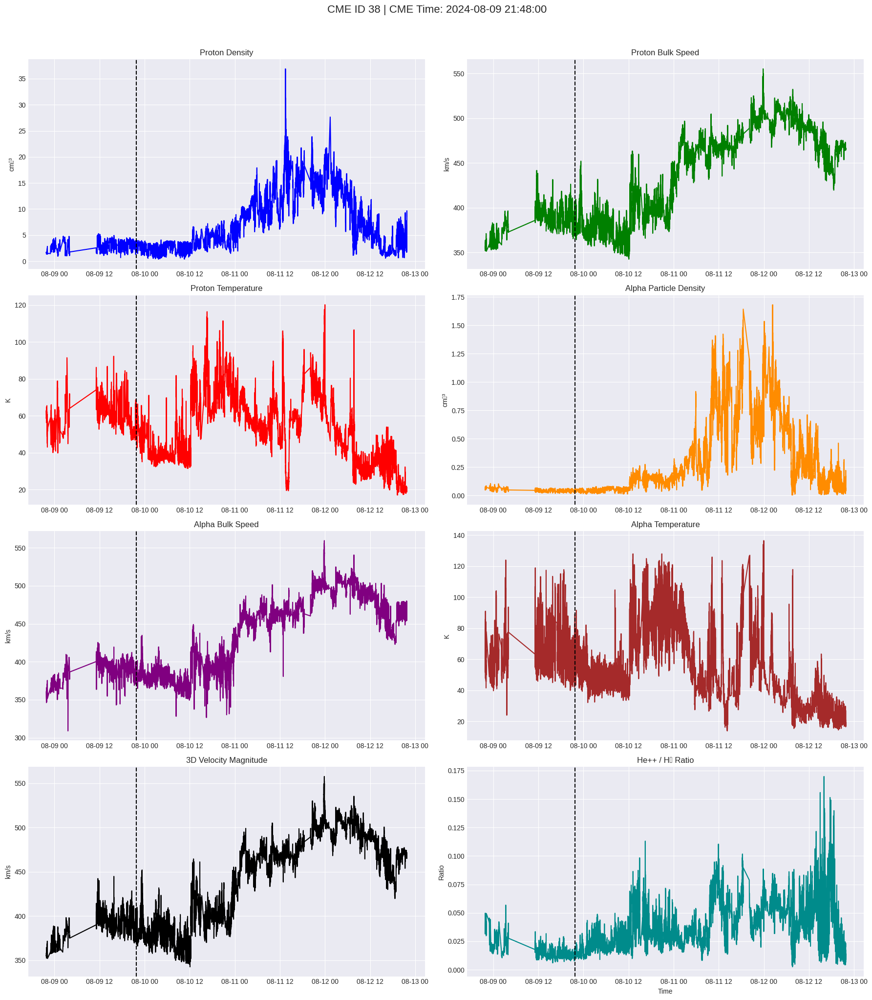

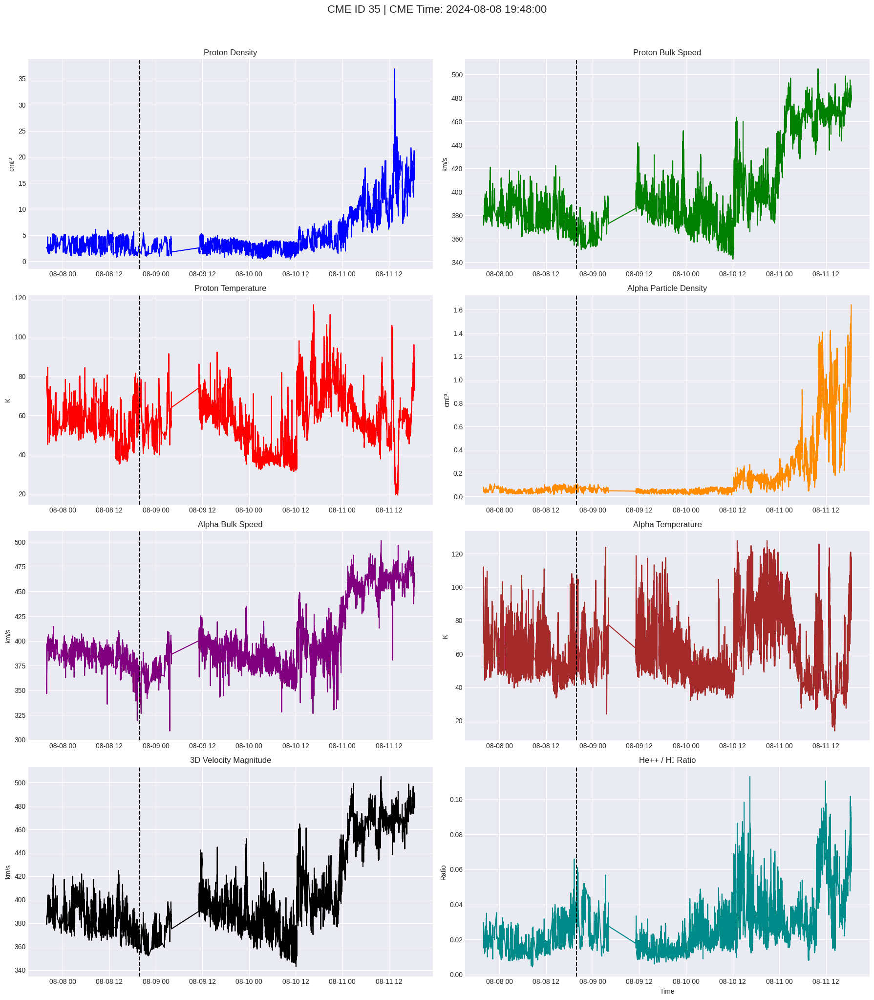

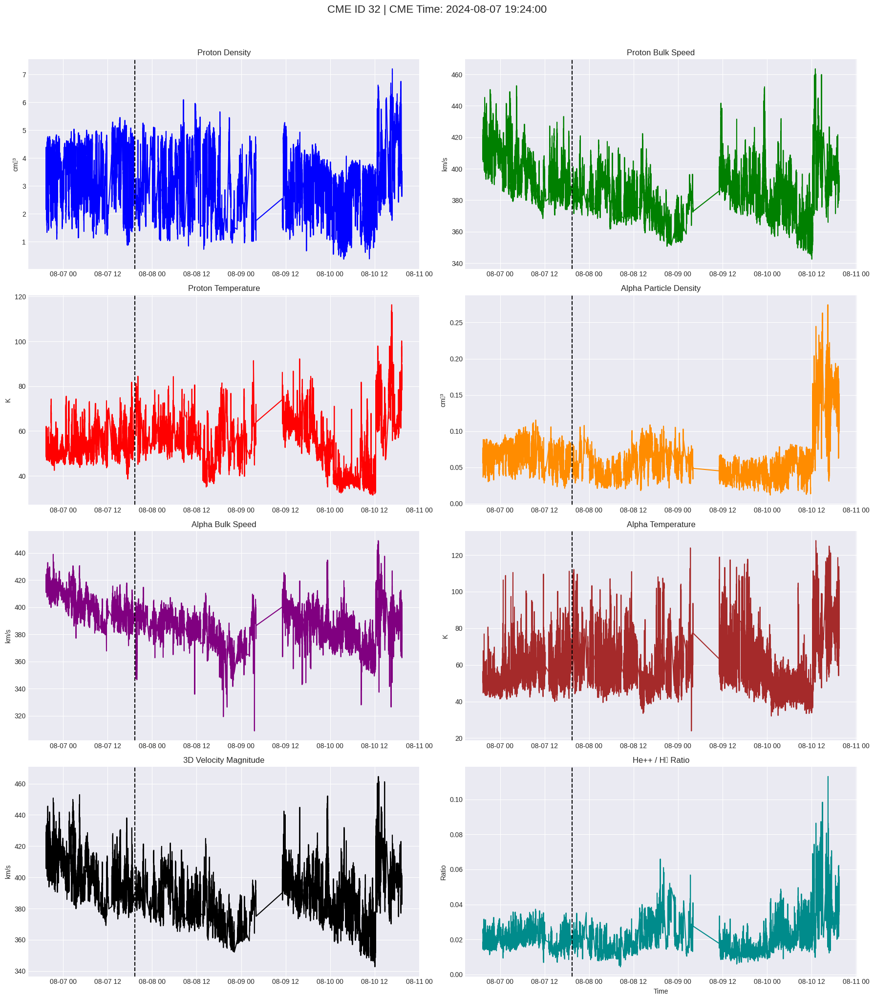

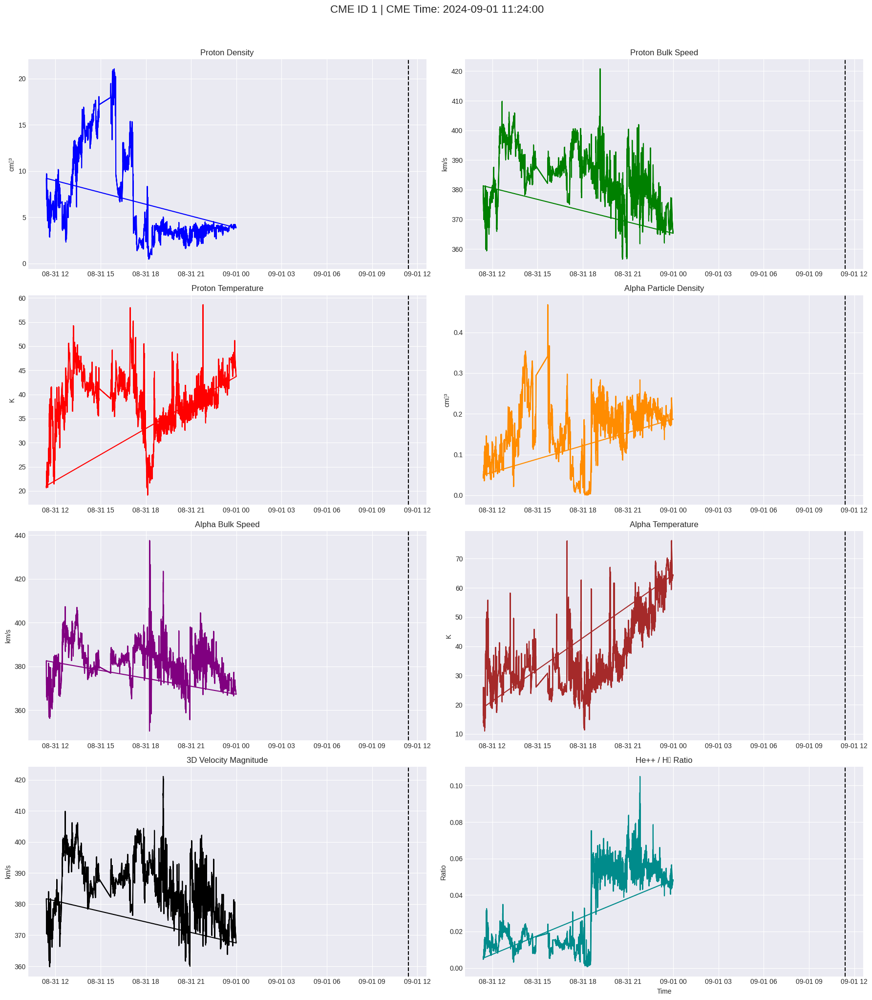

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv("swis_cme_windows_aug2024.csv", parse_dates=["Time", "CME_Time"])

df["He_H_Ratio"] = df["Alpha_Density"] / df["Proton_Density"].replace(0, np.nan)
df["Velocity_Magnitude"] = np.sqrt(df["Proton_Vx"]**2 + df["Proton_Vy"]**2 + df["Proton_Vz"]**2)

unique_ids = df["CME_ID"].unique()

for cme_id in unique_ids:
    sub_df = df[df["CME_ID"] == cme_id].copy()
    cme_time = sub_df["CME_Time"].iloc[0]

    plt.figure(figsize=(18, 20))
    plt.suptitle(f"CME ID {cme_id} | CME Time: {cme_time}", fontsize=16, y=1.02)

    plt.subplot(4, 2, 1)
    plt.plot(sub_df["Time"], sub_df["Proton_Density"], color='blue')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("Proton Density")
    plt.ylabel("cm⁻³")
    plt.grid(True)

    plt.subplot(4, 2, 2)
    plt.plot(sub_df["Time"], sub_df["Proton_Speed"], color='green')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("Proton Bulk Speed")
    plt.ylabel("km/s")
    plt.grid(True)

    plt.subplot(4, 2, 3)
    plt.plot(sub_df["Time"], sub_df["Proton_Temperature"], color='red')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("Proton Temperature")
    plt.ylabel("K")
    plt.grid(True)

    plt.subplot(4, 2, 4)
    plt.plot(sub_df["Time"], sub_df["Alpha_Density"], color='darkorange')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("Alpha Particle Density")
    plt.ylabel("cm⁻³")
    plt.grid(True)

    plt.subplot(4, 2, 5)
    plt.plot(sub_df["Time"], sub_df["Alpha_Speed"], color='purple')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("Alpha Bulk Speed")
    plt.ylabel("km/s")
    plt.grid(True)

    plt.subplot(4, 2, 6)
    plt.plot(sub_df["Time"], sub_df["Alpha_Temperature"], color='brown')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("Alpha Temperature")
    plt.ylabel("K")
    plt.grid(True)

    plt.subplot(4, 2, 7)
    plt.plot(sub_df["Time"], sub_df["Velocity_Magnitude"], color='black')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("3D Velocity Magnitude")
    plt.ylabel("km/s")
    plt.grid(True)

    plt.subplot(4, 2, 8)
    plt.plot(sub_df["Time"], sub_df["He_H_Ratio"], color='darkcyan')
    plt.axvline(cme_time, color='black', linestyle='--')
    plt.title("He++ / H⁺ Ratio")
    plt.ylabel("Ratio")
    plt.xlabel("Time")
    plt.grid(True)

    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv("swis_cme_windows_aug2024.csv", parse_dates=["Time", "CME_Time"])

df["He_H_Ratio"] = df["Alpha_Density"] / df["Proton_Density"].replace(0, np.nan)
df["Velocity_Magnitude"] = np.sqrt(df["Proton_Vx"]**2 + df["Proton_Vy"]**2 + df["Proton_Vz"]**2)

feature_cols = [
    "Proton_Density", "Proton_Speed", "Proton_Temperature",
    "Alpha_Density", "Alpha_Speed", "Alpha_Temperature",
    "Velocity_Magnitude", "He_H_Ratio"
]

all_cme_featured = []

for cme_id in df["CME_ID"].unique():
    sub_df = df[df["CME_ID"] == cme_id].copy()

    for col in feature_cols:
        sub_df[f"{col}_MA"] = sub_df[col].rolling(window=5, center=True, min_periods=1).mean()
        sub_df[f"{col}_Diff"] = sub_df[col].diff()
        sub_df[f"{col}_SpikeAboveMA"] = sub_df[col] - sub_df[f"{col}_MA"]

    all_cme_featured.append(sub_df)

featured_df = pd.concat(all_cme_featured, ignore_index=True)

featured_df.to_csv("swis_cme_featured_windows.csv", index=False)

print("Advanced features extracted with moving averages and gradients.")


✅ Advanced features extracted with moving averages and gradients.


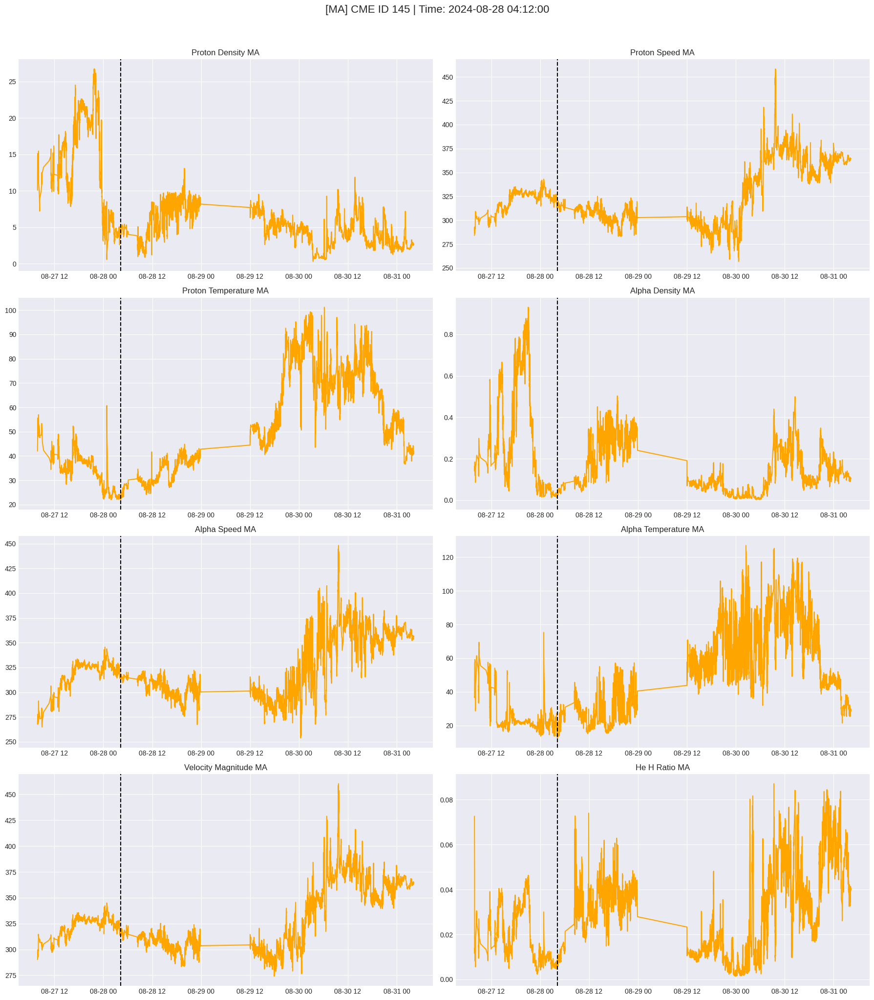

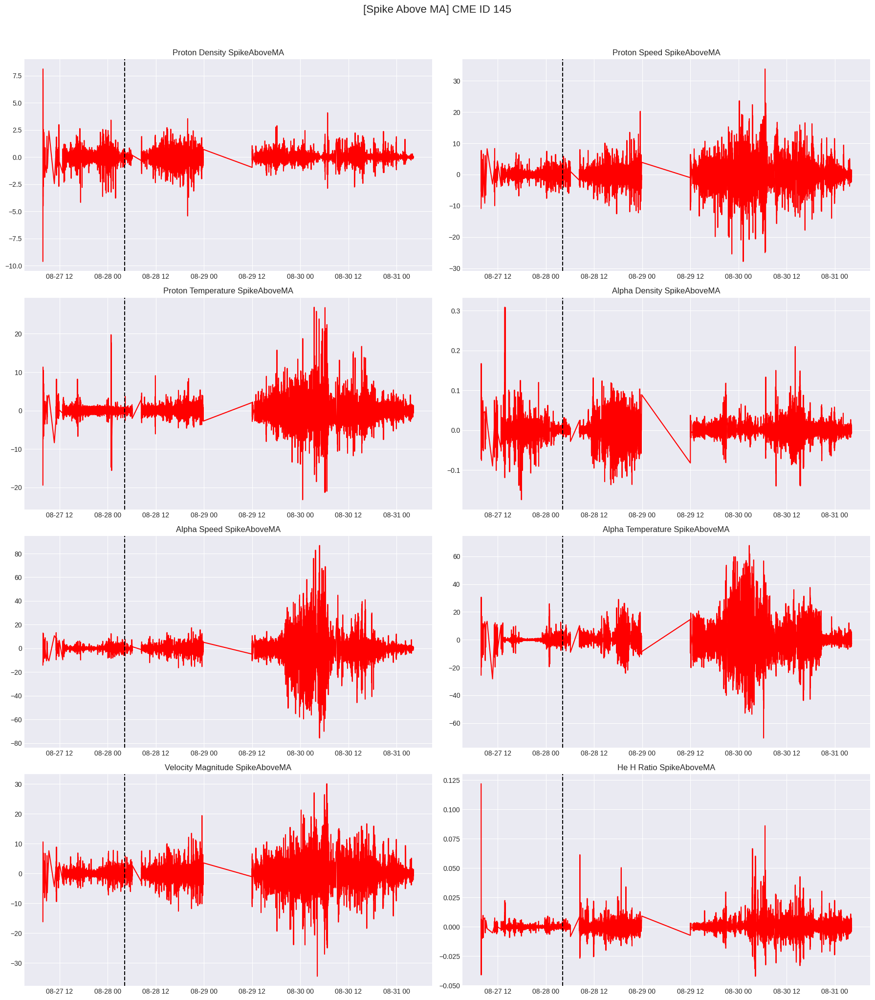

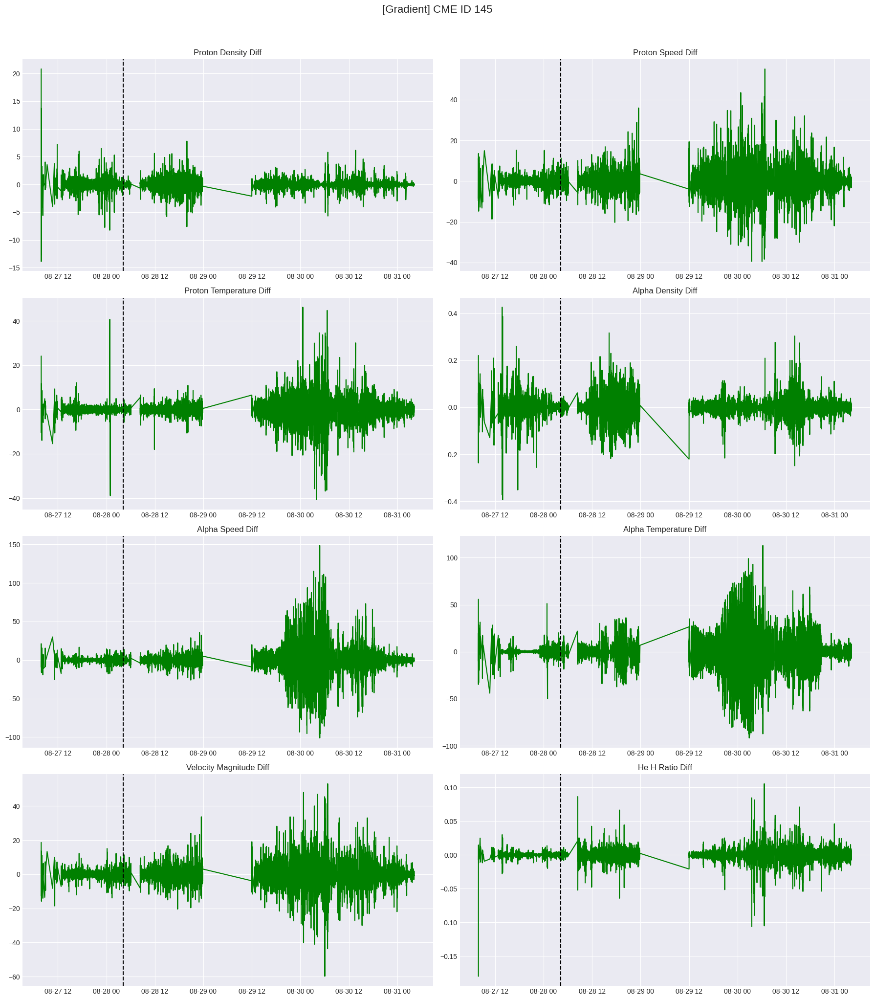

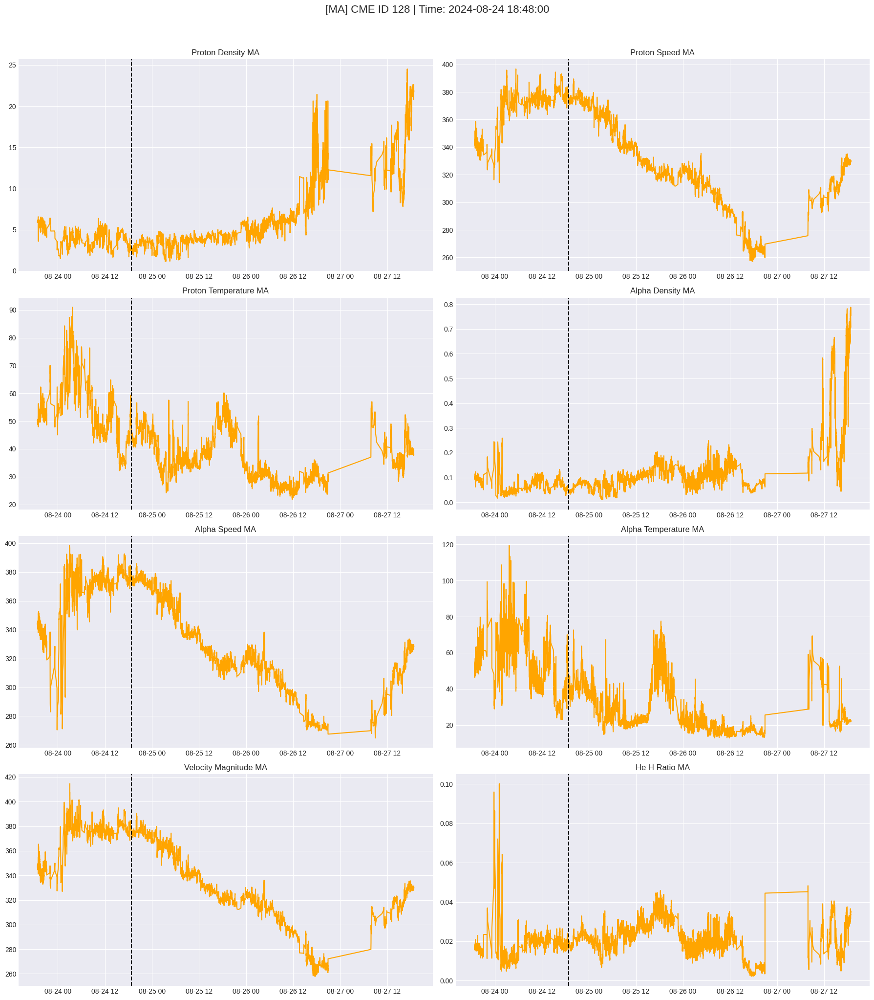

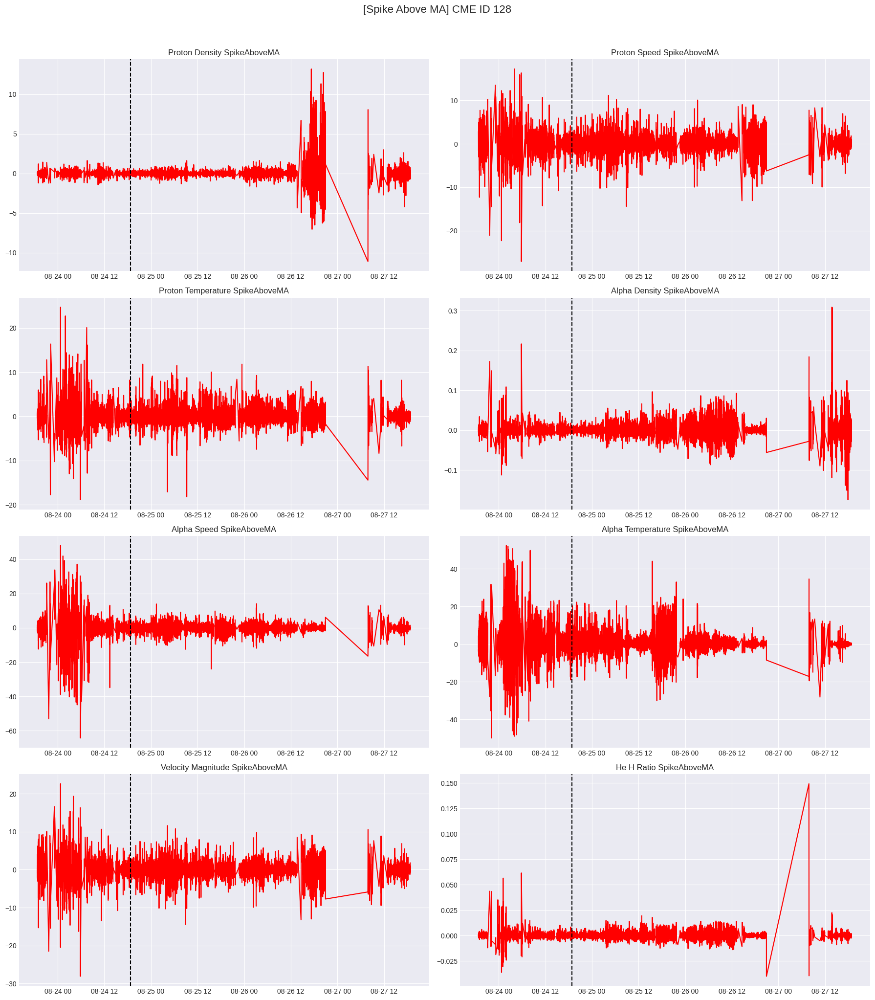

...

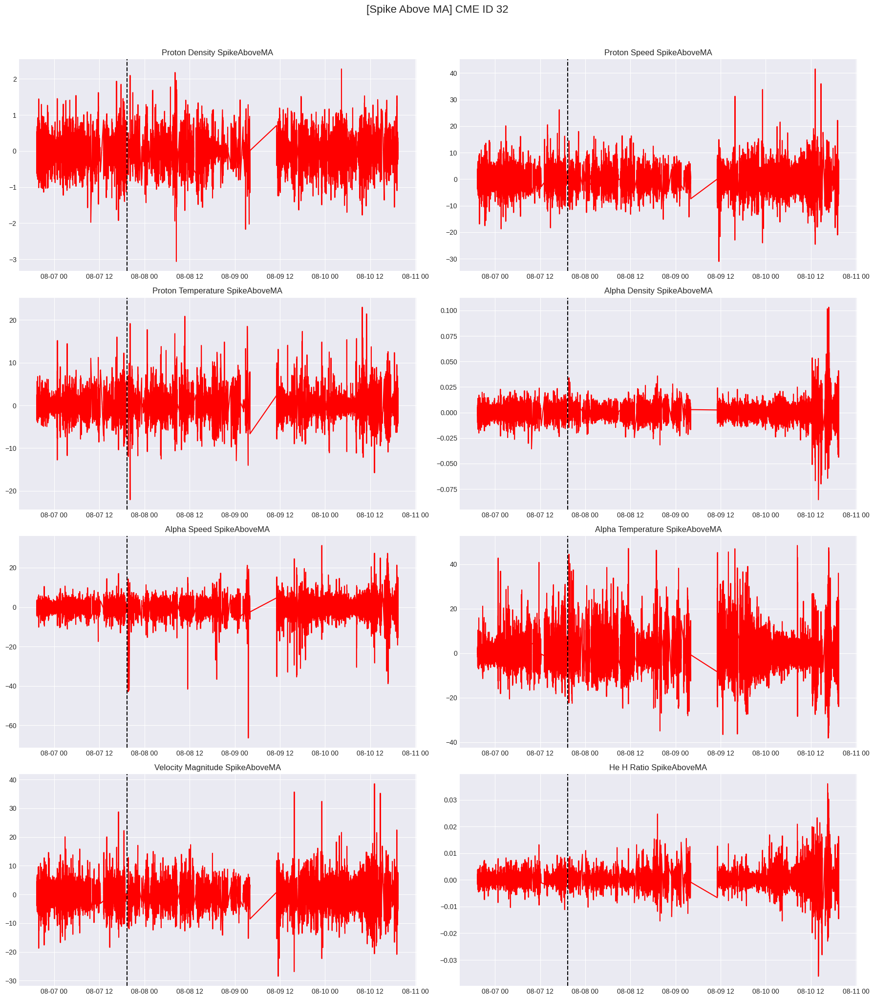

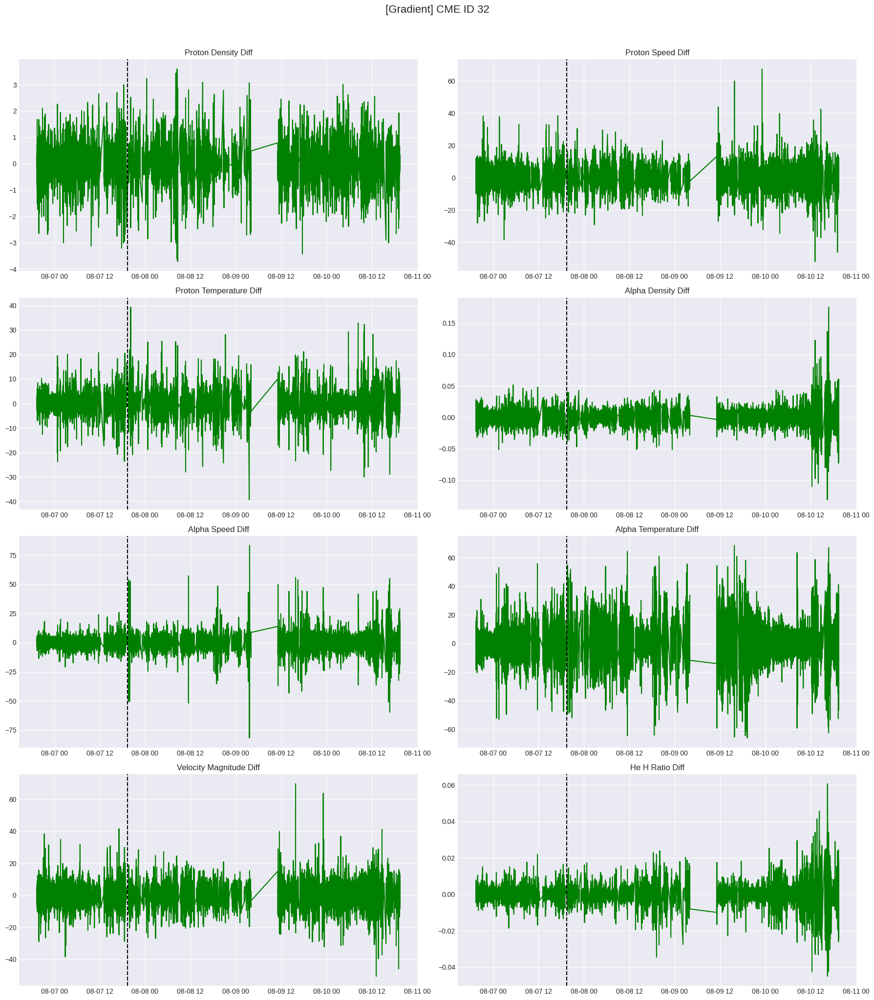

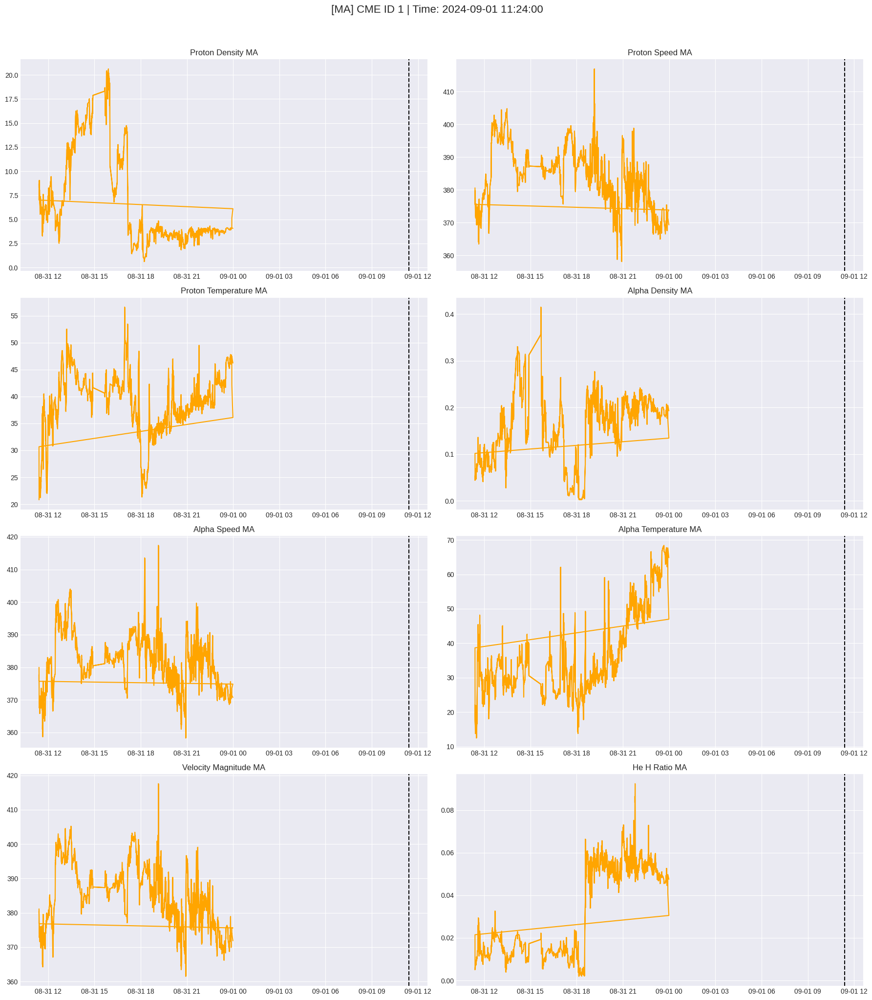

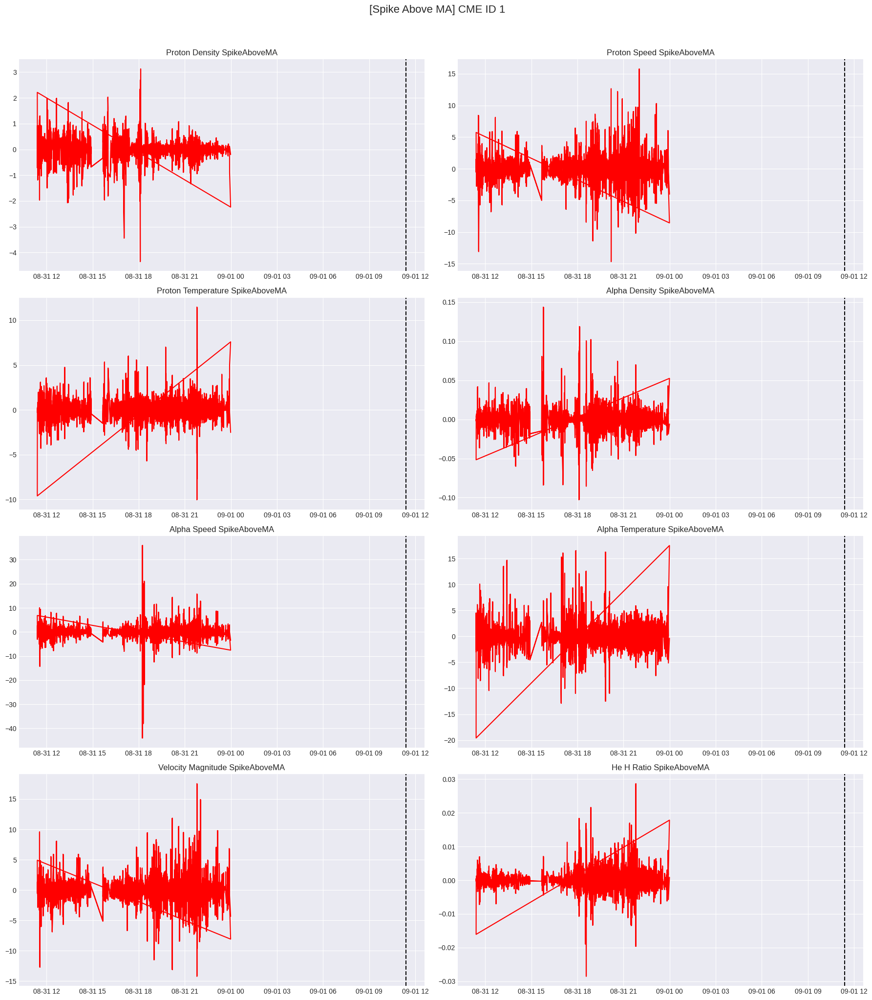

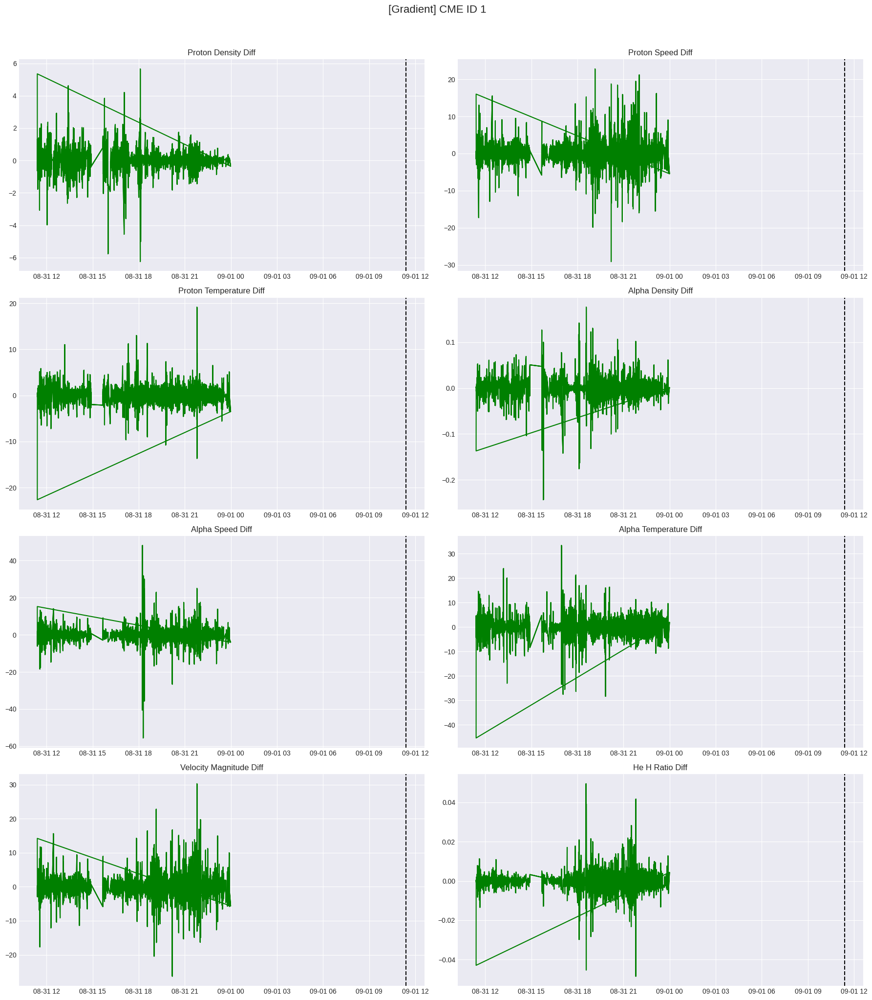

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.read_csv("swis_cme_featured_windows.csv", parse_dates=["Time", "CME_Time"])

base_features = [
    "Proton_Density", "Proton_Speed", "Proton_Temperature",
    "Alpha_Density", "Alpha_Speed", "Alpha_Temperature",
    "Velocity_Magnitude", "He_H_Ratio"
]

for cme_id in df["CME_ID"].unique():
    sub_df = df[df["CME_ID"] == cme_id].copy()
    cme_time = sub_df["CME_Time"].iloc[0]



    # MOVING AVERAGE PLOT
    plt.figure(figsize=(18, 20))
    plt.suptitle(f"[MA] CME ID {cme_id} | Time: {cme_time}", fontsize=16, y=1.02)
    for i, col in enumerate(base_features):
        ma_col = f"{col}_MA"
        if ma_col in sub_df.columns:
            plt.subplot(4, 2, i+1)
            plt.plot(sub_df["Time"], sub_df[ma_col], color='orange')
            plt.axvline(cme_time, color='black', linestyle='--')
            plt.title(f"{ma_col.replace('_', ' ')}")
            plt.grid(True)
    plt.tight_layout()
    plt.show()

    # SPIKE ABOVE MA PLOT
    plt.figure(figsize=(18, 20))
    plt.suptitle(f"[Spike Above MA] CME ID {cme_id}", fontsize=16, y=1.02)
    for i, col in enumerate(base_features):
        spike_col = f"{col}_SpikeAboveMA"
        if spike_col in sub_df.columns:
            plt.subplot(4, 2, i+1)
            plt.plot(sub_df["Time"], sub_df[spike_col], color='red')
            plt.axvline(cme_time, color='black', linestyle='--')
            plt.title(f"{spike_col.replace('_', ' ')}")
            plt.grid(True)
    plt.tight_layout()
    plt.show()

    # GRADIENT / DIFF PLOT
    plt.figure(figsize=(18, 20))
    plt.suptitle(f"[Gradient] CME ID {cme_id}", fontsize=16, y=1.02)
    for i, col in enumerate(base_features):
        diff_col = f"{col}_Diff"
        if diff_col in sub_df.columns:
            plt.subplot(4, 2, i+1)
            plt.plot(sub_df["Time"], sub_df[diff_col], color='green')
            plt.axvline(cme_time, color='black', linestyle='--')
            plt.title(f"{diff_col.replace('_', ' ')}")
            plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv("swis_cme_windows_aug2024.csv", parse_dates=["Time", "CME_Time"])

df["He_H_Ratio"] = df["Alpha_Density"] / df["Proton_Density"].replace(0, np.nan)
df["Velocity_Magnitude"] = np.sqrt(df["Proton_Vx"]**2 + df["Proton_Vy"]**2 + df["Proton_Vz"]**2)

features = {
    "Proton_Density": "Proton Density (cm⁻³)",
    "Proton_Speed": "Proton Speed (km/s)",
    "Proton_Temperature": "Proton Temp (K)",
    "Alpha_Density": "Alpha Density (cm⁻³)",
    "Alpha_Speed": "Alpha Speed (km/s)",
    "Alpha_Temperature": "Alpha Temp (K)",
    "Velocity_Magnitude": "3D Velocity (km/s)",
    "He_H_Ratio": "He++ / H⁺ Ratio"
}

threshold_table = []

for col, label in features.items():
    stats = df[col].describe(percentiles=[0.25, 0.5, 0.75, 0.9]).round(2)
    threshold_table.append({
        "Feature": label,
        "Mean": stats["mean"],
        "Median": stats["50%"],
        "75th Percentile": stats["75%"],
        "90th Percentile": stats["90%"],
        "Max": stats["max"]
    })

threshold_df = pd.DataFrame(threshold_table)

threshold_df.to_csv("halo_cme_thresholds.csv", index=False)

print("Computed thresholds for 8 CME features:")
print(threshold_df)


✅ Computed thresholds for 8 CME features:
                 Feature    Mean  Median  75th Percentile  90th Percentile  \
0  Proton Density (cm⁻³)    5.38    3.86             5.95            11.53   
1    Proton Speed (km/s)  380.86  380.81           399.14           460.19   
2        Proton Temp (K)   47.05   44.67            56.25            67.00   
3   Alpha Density (cm⁻³)    0.16    0.08             0.18             0.37   
4     Alpha Speed (km/s)  379.75  381.34           397.68           455.02   
5         Alpha Temp (K)   45.95   46.00            56.44            72.19   
6     3D Velocity (km/s)  382.66  382.50           401.52           460.74   
7        He++ / H⁺ Ratio    0.03    0.02             0.03             0.05   

      Max  
0   36.89  
1  555.29  
2  120.13  
3    1.68  
4  559.40  
5  159.37  
6  557.78  
7    0.38  


In [ ]:
import pandas as pd

df = pd.read_csv("swis_cme_featured_windows.csv")

raw_features = [
    "Proton_Density", "Proton_Speed", "Proton_Temperature",
    "Alpha_Density", "Alpha_Speed", "Alpha_Temperature",
    "Velocity_Magnitude", "He_H_Ratio"
]

suffixes = ["", "_MA", "_SpikeAboveMA", "_Diff"]
threshold_rows = []

for base in raw_features:
    for suffix in suffixes:
        col = base + suffix
        if col in df.columns:
            stats = df[col].describe(percentiles=[0.5, 0.75, 0.9]).round(3)
            threshold_rows.append({
                "Feature": col,
                "Mean": stats["mean"],
                "Median": stats["50%"],
                "75th Percentile": stats["75%"],
                "90th Percentile": stats["90%"],
                "Max": stats["max"]
            })
        else:
            print(f"⚠️ Skipped missing feature: {col}")

threshold_df = pd.DataFrame(threshold_rows)
threshold_df.to_csv("final_threshold_values_all_features.csv", index=False)

print("Thresholds computed for all available features:")
display(threshold_df)



✅ Thresholds computed for all available features:


,Feature,Mean,Median,75th Percentile,90th Percentile,Max
0,Proton_Density,5.376,3.859,5.946,11.527,36.887
1,Proton_Density_MA,5.376,3.852,5.921,11.522,31.459
2,Proton_Density_SpikeAboveMA,-0.000,-0.000,0.101,0.262,13.191
3,Proton_Density_Diff,0.000,0.001,0.145,0.385,20.793
4,Proton_Speed,380.859,380.811,399.139,460.185,555.288
5,Proton_Speed_MA,380.859,380.855,398.999,460.109,548.898
6,Proton_Speed_SpikeAboveMA,-0.000,0.000,0.856,2.218,41.518
7,Proton_Speed_Diff,0.001,-0.023,1.376,3.478,67.279
8,Proton_Temperature,47.049,44.669,56.253,67.004,120.134
9,Proton_Temperature_MA,47.049,44.701,56.241,66.920,118.685


In [ ]:
import pandas as pd

df = pd.read_csv("swis_cme_featured_windows.csv", parse_dates=["Time", "CME_Time"])
thresholds = pd.read_csv("final_threshold_values_all_features.csv").set_index("Feature")

base_features = [
    "Proton_Density", "Proton_Speed", "Proton_Temperature",
    "Alpha_Density", "Alpha_Speed", "Alpha_Temperature",
    "Velocity_Magnitude", "He_H_Ratio"
]

# Feature types to compare
suffixes = ["", "_MA", "_SpikeAboveMA", "_Diff"]

detections = []

for cme_id in df["CME_ID"].unique():
    sub_df = df[df["CME_ID"] == cme_id]
    cme_time = sub_df["CME_Time"].iloc[0]

    score = 0
    score_detail = {}

    for base in base_features:
        for suffix in suffixes:
            col = base + suffix
            if col in sub_df.columns and col in thresholds.index:
                max_val = sub_df[col].max()
                threshold_90 = thresholds.loc[col]["90th Percentile"]
                is_exceeded = int(max_val > threshold_90)
                score += is_exceeded
                score_detail[f"{col}_Exceeded"] = is_exceeded

    detections.append({
        "CME_ID": cme_id,
        "CME_Time": cme_time,
        "Total_Score": score,
        "Detected_CME": 1 if score >= 3 else 0,
        **score_detail
    })

detection_df = pd.DataFrame(detections)

detection_df.to_csv("cme_rule_based_detection_scores.csv", index=False)

print("Rule-based CME detection completed.")
print(f"Detected {detection_df['Detected_CME'].sum()} out of {len(detection_df)} CME windows.")
display(detection_df.head())


✅ Rule-based CME detection completed.
✅ Detected 7 out of 7 CME windows.


,CME_ID,CME_Time,Total_Score,Detected_CME,Proton_Density_Exceeded,Proton_Density_MA_Exceeded,Proton_Density_SpikeAboveMA_Exceeded,Proton_Density_Diff_Exceeded,Proton_Speed_Exceeded,Proton_Speed_MA_Exceeded,...,Alpha_Temperature_SpikeAboveMA_Exceeded,Alpha_Temperature_Diff_Exceeded,Velocity_Magnitude_Exceeded,Velocity_Magnitude_MA_Exceeded,Velocity_Magnitude_SpikeAboveMA_Exceeded,Velocity_Magnitude_Diff_Exceeded,He_H_Ratio_Exceeded,He_H_Ratio_MA_Exceeded,He_H_Ratio_SpikeAboveMA_Exceeded,He_H_Ratio_Diff_Exceeded
0,145,2024-08-28 04:12:00,28,1,1,1,1,1,1,0,...,1,1,1,0,1,1,1,1,1,1
1,128,2024-08-24 18:48:00,26,1,1,1,1,1,0,0,...,1,1,0,0,1,1,1,1,1,1
2,64,2024-08-14 07:00:00,30,1,0,0,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
3,38,2024-08-09 21:48:00,32,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
4,35,2024-08-08 19:48:00,32,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv("swis_cme_windows_aug2024.csv", parse_dates=["Time", "CME_Time"])

df["He_H_Ratio"] = np.where(df["Proton_Density"] == 0, np.nan,
                            df["Alpha_Density"] / df["Proton_Density"])
df["Velocity_Magnitude"] = np.sqrt(
    df["Proton_Vx"]**2 + df["Proton_Vy"]**2 + df["Proton_Vz"]**2
)

df["Time_Since_CME_hr"] = (df["Time"] - df["CME_Time"]).dt.total_seconds() / 3600
pre_cme_df = df[df["Time_Since_CME_hr"] < 0]
post_cme_df = df[df["Time_Since_CME_hr"] >= 0]

features = {
    "Proton_Density": "Proton Density (cm⁻³)",
    "Proton_Speed": "Proton Speed (km/s)",
    "Proton_Temperature": "Proton Thermal Velocity (km/s)",
    "Alpha_Density": "Alpha Density (cm⁻³)",
    "Alpha_Speed": "Alpha Speed (km/s)",
    "Alpha_Temperature": "Alpha Thermal Velocity (km/s)",
    "Velocity_Magnitude": "3D Velocity (km/s)",
    "He_H_Ratio": "He++ / H⁺ Ratio"
}

# Compare pre- and post-CME
comparison_table = []

for col, label in features.items():
    pre_stats = pre_cme_df[col].describe(percentiles=[0.9]).round(3)
    post_stats = post_cme_df[col].describe(percentiles=[0.9]).round(3)

    comparison_table.append({
        "Feature": label,
        "Pre-CME Mean": pre_stats["mean"],
        "Post-CME Mean": post_stats["mean"],
        "Δ Mean": round(post_stats["mean"] - pre_stats["mean"], 3),
        "Pre-CME Median": pre_stats["50%"],
        "Post-CME Median": post_stats["50%"],
        "Δ Median": round(post_stats["50%"] - pre_stats["50%"], 3),
        "Pre-CME 90th %ile": pre_stats["90%"],
        "Post-CME 90th %ile": post_stats["90%"],
        "Δ 90th %ile": round(post_stats["90%"] - pre_stats["90%"], 3),
    })

comparison_df = pd.DataFrame(comparison_table)
comparison_df.to_csv("pre_post_cme_comparison.csv", index=False)

print("Pre- vs. Post-CME Comparison Table:")
display(comparison_df)


📊 Pre- vs. Post-CME Comparison Table:


,Feature,Pre-CME Mean,Post-CME Mean,Δ Mean,Pre-CME Median,Post-CME Median,Δ Median,Pre-CME 90th %ile,Post-CME 90th %ile,Δ 90th %ile
0,Proton Density (cm⁻³),5.402,5.364,-0.038,3.861,3.858,-0.003,13.169,11.185,-1.984
1,Proton Speed (km/s),379.889,381.280,1.391,384.263,378.002,-6.261,408.251,470.235,61.984
2,Proton Thermal Velocity (km/s),46.035,47.489,1.454,46.437,43.564,-2.873,59.758,70.275,10.517
3,Alpha Density (cm⁻³),0.139,0.168,0.029,0.078,0.086,0.008,0.284,0.395,0.111
4,Alpha Speed (km/s),379.406,379.901,0.495,384.500,378.705,-5.795,407.797,465.593,57.796
5,Alpha Thermal Velocity (km/s),44.187,46.713,2.526,47.506,45.289,-2.217,61.771,77.280,15.509
6,3D Velocity (km/s),381.752,383.057,1.305,385.685,380.243,-5.442,410.893,471.137,60.244
7,He++ / H⁺ Ratio,0.030,0.028,-0.002,0.020,0.023,0.003,0.056,0.053,-0.003


In [ ]:
import pandas as pd

df = pd.read_csv("swis_cme_featured_windows.csv", parse_dates=["Time", "CME_Time"])
thresholds = pd.read_csv("final_threshold_values_all_features.csv").set_index("Feature")

base_features = [
    "Proton_Density", "Proton_Speed", "Proton_Temperature",
    "Alpha_Density", "Alpha_Speed", "Alpha_Temperature",
    "Velocity_Magnitude", "He_H_Ratio"
]

# Feature variants to check
suffixes = ["", "_MA", "_SpikeAboveMA", "_Diff"]

total_checks = len(base_features) * len(suffixes)
detections = []

for cme_id in df["CME_ID"].unique():
    sub_df = df[df["CME_ID"] == cme_id]
    cme_time = sub_df["CME_Time"].iloc[0]

    score = 0
    score_detail = {}

    for base in base_features:
        for suffix in suffixes:
            col = base + suffix
            if col in sub_df.columns and col in thresholds.index:
                max_val = sub_df[col].max()
                threshold_90 = thresholds.loc[col]["90th Percentile"]
                is_cme_like = max_val > threshold_90
                score += int(is_cme_like)
                score_detail[f"{col}_Exceeded"] = int(is_cme_like)

    detections.append({
        "CME_ID": cme_id,
        "CME_Time": cme_time,
        "Total_Score": score,
        "Detected_CME": 1 if score >= 3 else 0,
        "Pct_Features_Exceeded": round(score / total_checks, 3),
        **score_detail
    })

detection_df = pd.DataFrame(detections)

# normalized confidence score
detection_df["Confidence"] = detection_df["Total_Score"] / detection_df["Total_Score"].max()

detection_df.to_csv("cme_rule_based_detection_scores.csv", index=False)

print("Rule-based CME detection completed with enhancements.")
print(detection_df[["CME_ID", "CME_Time", "Total_Score", "Detected_CME", "Pct_Features_Exceeded", "Confidence"]].head())

# Identify top-triggering features across all events
score_cols = [col for col in detection_df.columns if "_Exceeded" in col]
trigger_ranking = detection_df[score_cols].sum().sort_values(ascending=False)

print("\nTop Triggering Features Across All CME Events:")
print(trigger_ranking.head(10))

✅ Rule-based CME detection completed with enhancements.
   CME_ID            CME_Time  Total_Score  Detected_CME  \
0     145 2024-08-28 04:12:00           28             1   
1     128 2024-08-24 18:48:00           26             1   
2      64 2024-08-14 07:00:00           30             1   
3      38 2024-08-09 21:48:00           32             1   
4      35 2024-08-08 19:48:00           32             1   

   Pct_Features_Exceeded  Confidence  
0                  0.875      0.8750  
1                  0.812      0.8125  
2                  0.938      0.9375  
3                  1.000      1.0000  
4                  1.000      1.0000  

🔝 Top Triggering Features Across All CME Events:
Proton_Density_Diff_Exceeded                7.0
He_H_Ratio_SpikeAboveMA_Exceeded            7.0
Proton_Density_SpikeAboveMA_Exceeded        7.0
Proton_Speed_SpikeAboveMA_Exceeded          7.0
Proton_Speed_Diff_Exceeded                  7.0
Alpha_Density_Diff_Exceeded                 7.0
Alpha_Densi

In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv("swis_cme_featured_windows.csv", parse_dates=["Time", "CME_Time"])

cme_feature_rows = []

base_features = [
    "Proton_Density", "Proton_Speed", "Proton_Temperature",
    "Alpha_Density", "Alpha_Speed", "Alpha_Temperature",
    "Velocity_Magnitude", "He_H_Ratio"
]

variants = ["", "_MA", "_SpikeAboveMA", "_Diff"]

for cme_id in df["CME_ID"].unique():
    sub_df = df[df["CME_ID"] == cme_id]
    cme_time = sub_df["CME_Time"].iloc[0]

    row = {"CME_ID": cme_id, "CME_Time": cme_time}

    for feat in base_features:
        for suffix in variants:
            col = feat + suffix
            if col in sub_df.columns:
                row[f"{col}_mean"] = sub_df[col].mean()
                row[f"{col}_max"] = sub_df[col].max()
                row[f"{col}_std"] = sub_df[col].std()

    cme_feature_rows.append(row)

cme_summary_df = pd.DataFrame(cme_feature_rows)

cme_summary_df.to_csv("cme_summary_features_per_window.csv", index=False)

print("CME summary feature table saved as:")
print("cme_summary_features_per_window.csv")


✅ CME summary feature table saved as:
👉 cme_summary_features_per_window.csv


In [ ]:
import pandas as pd

df = pd.read_csv("swis_cme_featured_windows.csv")

# Load the threshold values
thresholds = pd.read_csv("final_threshold_values_all_features.csv").set_index("Feature")

# Base features and suffixes used earlier
base_features = [
    "Proton_Density", "Proton_Speed", "Proton_Temperature",
    "Alpha_Density", "Alpha_Speed", "Alpha_Temperature",
    "Velocity_Magnitude", "He_H_Ratio"
]
suffixes = ["", "_MA", "_SpikeAboveMA", "_Diff"]

# Define weights for better scoring
weights = {
    "Proton_Density": 1.5,
    "Proton_Speed": 1.5,
    "Proton_Temperature": 1.5,
    "Alpha_Density": 1,
    "Alpha_Speed": 1,
    "Alpha_Temperature": 1,
    "Velocity_Magnitude": 1,
    "He_H_Ratio": 1,
    "_SpikeAboveMA": 0.5,
    "_Diff": 0.5,
    "_MA": 0.5
}

# Step 2: Score each CME window
detections = []

for cme_id in df["CME_ID"].unique():
    sub_df = df[df["CME_ID"] == cme_id]
    cme_time = sub_df["CME_Time"].iloc[0]

    weighted_score = 0
    score_detail = {}

    for base in base_features:
        base_weight = weights.get(base, 1)
        for suffix in suffixes:
            col = base + suffix
            if col in sub_df.columns and col in thresholds.index:
                threshold = thresholds.loc[col]["90th Percentile"]
                max_val = sub_df[col].max()
                suffix_weight = weights.get(suffix, 1)
                final_weight = base_weight * suffix_weight
                exceeded = int(max_val > threshold)
                weighted_score += exceeded * final_weight
                score_detail[f"{col}_Exceeded"] = exceeded

    detections.append({
        "CME_ID": cme_id,
        "CME_Time": cme_time,
        "Weighted_Score": round(weighted_score, 2),
        "Detected_CME": 1 if weighted_score >= 5 else 0,
        **score_detail
    })

# Step 3: Save to CSV
detection_df = pd.DataFrame(detections)
detection_df.to_csv("improved_cme_detection_weighted.csv", index=False)
print("✅ File regenerated and saved: improved_cme_detection_weighted.csv")


✅ File regenerated and saved: improved_cme_detection_weighted.csv


📊 Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         2

    accuracy                           1.00         2
   macro avg       1.00      1.00      1.00         2
weighted avg       1.00      1.00      1.00         2



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


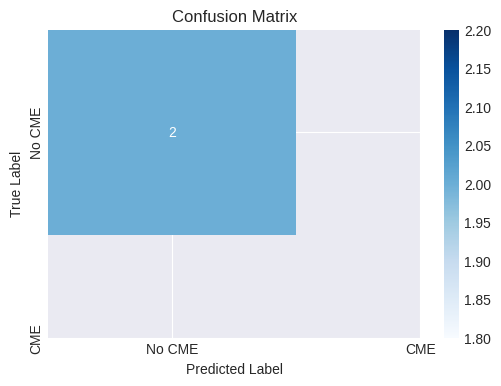


📈 Top 10 Feature Importances:
Proton_Density_mean                 0.0
Proton_Density_max                  0.0
Proton_Density_std                  0.0
Proton_Density_MA_mean              0.0
Proton_Density_MA_max               0.0
Proton_Density_MA_std               0.0
Proton_Density_SpikeAboveMA_mean    0.0
Proton_Density_SpikeAboveMA_max     0.0
Proton_Density_SpikeAboveMA_std     0.0
Proton_Density_Diff_mean            0.0
dtype: float64


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
features_df = pd.read_csv("cme_summary_features_per_window.csv")
labels_df = pd.read_csv("improved_cme_detection_weighted.csv")[["CME_ID", "Detected_CME"]]

# Merge features and labels
df = pd.merge(features_df, labels_df, on="CME_ID")

# Prepare features and target
X = df.drop(columns=["CME_ID", "CME_Time", "Detected_CME"], errors="ignore")
y = df["Detected_CME"]
X = X.fillna(0)

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
clf = DecisionTreeClassifier(max_depth=4, random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# Report
print("📊 Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=["No CME", "CME"], yticklabels=["No CME", "CME"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Optional: Feature importances
feat_imp = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)
print("\n📈 Top 10 Feature Importances:")
print(feat_imp.head(10))


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# Load feature and label data
features_df = pd.read_csv("cme_summary_features_per_window.csv")
labels_df = pd.read_csv("improved_cme_detection_weighted.csv")[["CME_ID", "Detected_CME"]]

# Merge on CME_ID
df = pd.merge(features_df, labels_df, on="CME_ID")

# Define X (features) and y (label)
X = df.drop(columns=["CME_ID", "CME_Time", "Detected_CME"], errors="ignore").fillna(0)
y = df["Detected_CME"]

# Split into train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Decision Tree
clf = DecisionTreeClassifier(max_depth=4, random_state=42)
clf.fit(X_train, y_train)

# Evaluate
y_pred = clf.predict(X_test)
print("📊 Classification Report:")
print(classification_report(y_test, y_pred))

# Save predictions to full DataFrame
df["Predicted_CME"] = clf.predict(X)
df.to_csv("final_cme_predictions.csv", index=False)
print("✅ Predictions saved to: final_cme_predictions.csv")

# Feature Importance
importances = pd.Series(clf.feature_importances_, index=X.columns).sort_values(ascending=False)
importances.to_csv("feature_importance.csv")



📊 Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         2

    accuracy                           1.00         2
   macro avg       1.00      1.00      1.00         2
weighted avg       1.00      1.00      1.00         2

✅ Predictions saved to: final_cme_predictions.csv
